In [2]:
import numpy as np
from matplotlib.colors import ListedColormap

# # create a map to convert panoptic id into colors
# def colorize_panoptic(pan_map,label_divisor,num):

# check the class_id map
from VIP_data import MyDataset
from config import Config
from torch.utils.data import DataLoader
import torch
from torchvision.transforms import ToPILImage
import matplotlib.pyplot as plt
to_pil=ToPILImage()
cfg=Config()
dataset_train = MyDataset(cfg.gt_dir_DVPS, split='train_1024_512')
dataset_val = MyDataset(cfg.gt_dir_DVPS,split='val_1024_512')
dataloader_train = DataLoader(dataset_train, batch_size=cfg.batch_size_train, shuffle=False, num_workers=4,drop_last=True)

max_calss_record = 0
for (_, class_labels_pair,instance_labels_pair,_) in  dataloader_train:
    H = class_labels_pair.size(-2)
    W = class_labels_pair.size(-1)
    class_labels_pair = [sample for sample in class_labels_pair if torch.sum(sample)!=-2*H*W]
    class_labels_pair= torch.stack(class_labels_pair,dim=0)
    instance_labels_pair = [sample for sample in instance_labels_pair if torch.sum(sample)!=-2*H*W]
    instance_labels_pair =  torch.stack(instance_labels_pair,dim=0)
    class_labels = class_labels_pair[:,0,:,:] # tensor
    max_class = np.max(class_labels.numpy())
    if max_calss_record < max_class:
        max_calss_record = max_class


print(f'max class_id is :{max_calss_record}')



max class_id is :32.0


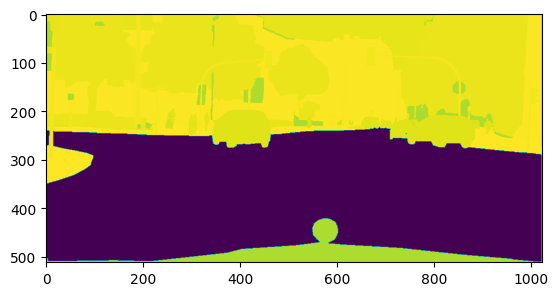

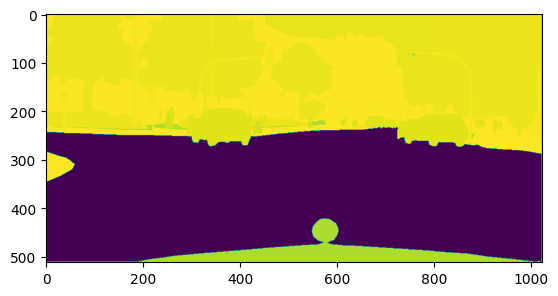

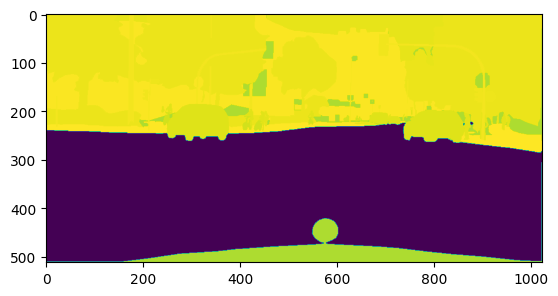

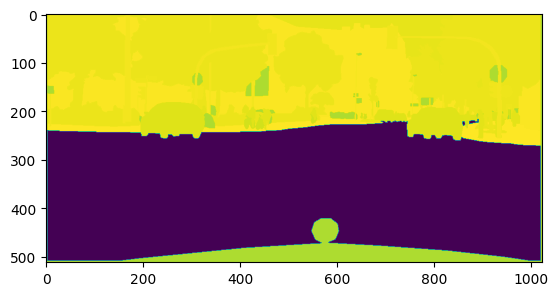

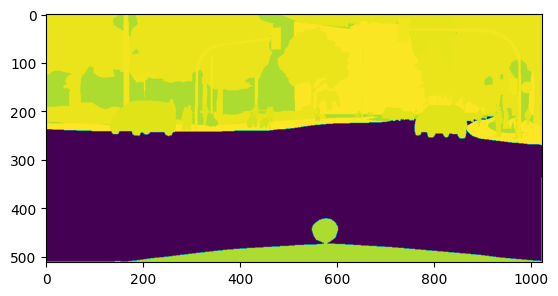

...

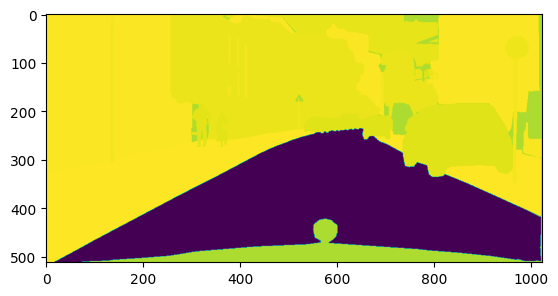

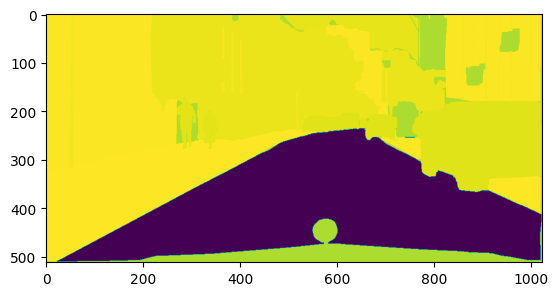

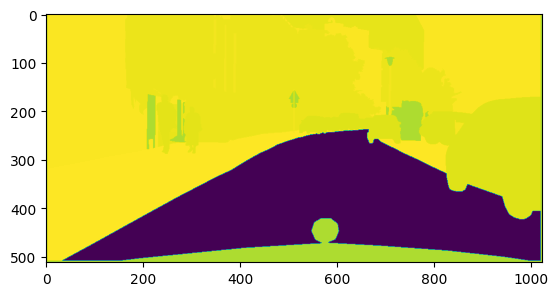

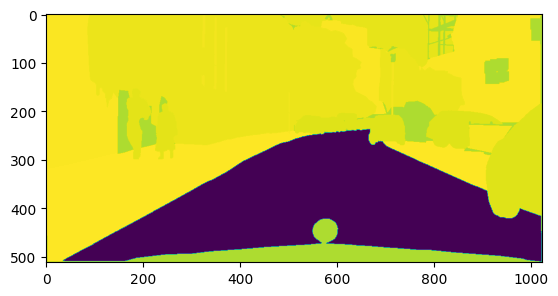

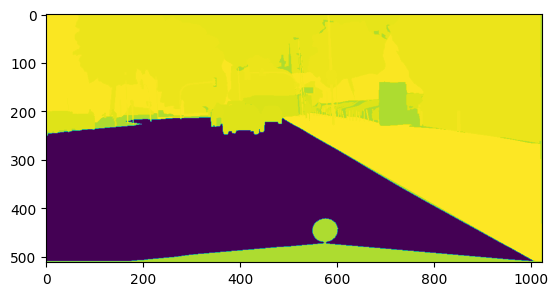

In [3]:

for (_, class_labels_pair,instance_labels_pair,_) in  dataloader_train:
    H = class_labels_pair.size(-2)
    W = class_labels_pair.size(-1)
    class_labels_pair = [sample for sample in class_labels_pair if torch.sum(sample)!=-2*H*W]
    class_labels_pair= torch.stack(class_labels_pair,dim=0)
    class_labels = class_labels_pair[:,0,:,:] 
    for i in range(class_labels.size(dim=0)):
        plt.imshow((class_labels[i]).numpy())
        plt.show()